# **Dog Breed Image Classification**

<a name="table"></a>
##Table of contents:

* ### A) [Imports and data loading](#A)
  * [Establishing tensorflow version 1.15.0](#D1)
  * [PyDrive Implementation and Mounting Google Drive to Access Data Files](#D2)
  * [Importing the dog image data](#D3)
  * [Importing Necessary Python Libraries](#D4) 
  * [Importing the labels data](#D5) 
 

* ### B) [Viewing and Managing the Data](#B)
  * [Printing out all 120 unique dog breeds](#D6) 
  * [Loading images and matching to their corresponding labels](#D7) 
  * [Encoding the labels (categorical features) into numerical values](#D8)
  * [Getting the original label values from the categorical-"ized" label variable](#D9)
  * [Working with the labels](#D10)
  * [Proving that the labels are corresponding to the correct integer values](#D11)

* ### C) [Applying a CNN Model to the Data (specifically, Densenet)](#C)
  * [The shape of the data](#D12)
  * [Keras Densenet with 120 classes](#D13)
  * [Training the model](#D14)

* ### D) [Prediction of Dog Breed](#D)
  * ["Let's try this model on my Blenheim Spaniel"](#D15)

* ### E) [Model Results on Test Data](#E)
  * [Creating a Prediction Breed vs. Actual Breed DataFrame](#D16)
  * [Number of Incorrect Predictions](#D17)
  * [Number of Correct Predictions](#D18)
  * [Percent Correct Predictions](#D19)
  * [Percent Incorrect Predictions](#D20)
  * [Which dog breeds was the model best at predicting?](#D21)
  * [Which dog breeds was the model worst at predicting?](#D22)





 <a name="A"></a>
# A) Imports and Data Loading


##### [**...Back to table of contents** ](#table)


 <a name="D1"></a>
### Establishing tensorflow version 1.15.0 


##### [**...Back to table of contents** ](#table)

In [1]:
%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)

1.15.0



 <a name="D2"></a>
### PyDrive Implementation and Mounting Google Drive to Access Data Files


##### [**...Back to table of contents** ](#table)

In [2]:
!pip install PyDrive

In [0]:
import os
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)


 <a name="D3"></a>
### Importing the dog image data


##### [**...Back to table of contents** ](#table)

In [0]:
download = drive.CreateFile({'id': '1c-I38t1szJAgGnVLfvjkx4OxAGGylCO2'})

In [6]:
download.GetContentFile('train.zip')
!unzip train.zip

Archive:  train.zip
   creating: train/
  inflating: train/000bec180eb18c7604dcecc8fe0dba07.jpg  
  inflating: train/001513dfcb2ffafc82cccf4d8bbaba97.jpg  
  inflating: train/001cdf01b096e06d78e9e5112d419397.jpg  
  inflating: train/00214f311d5d2247d5dfe4fe24b2303d.jpg  
  inflating: train/0021f9ceb3235effd7fcde7f7538ed62.jpg  
  inflating: train/002211c81b498ef88e1b40b9abf84e1d.jpg  
  inflating: train/00290d3e1fdd27226ba27a8ce248ce85.jpg  
  inflating: train/002a283a315af96eaea0e28e7163b21b.jpg  
  inflating: train/003df8b8a8b05244b1d920bb6cf451f9.jpg  
  inflating: train/0042188c895a2f14ef64a918ed9c7b64.jpg  
  inflating: train/004396df1acd0f1247b740ca2b14616e.jpg  
  inflating: train/0067dc3eab0b3c3ef0439477624d85d6.jpg  
  inflating: train/00693b8bc2470375cc744a6391d397ec.jpg  
  inflating: train/006cc3ddb9dc1bd827479569fcdc52dc.jpg  
  inflating: train/0075dc49dab4024d12fafe67074d8a81.jpg  
  inflating: train/00792e341f3c6eb33663e415d0715370.jpg  
  inflating: train/007b5a16db9d9


 <a name="D4"></a>
### Importing Necessary Python Libraries


##### [**...Back to table of contents** ](#table)

In [7]:
import keras
import math
from sklearn.preprocessing import LabelEncoder
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras.preprocessing import image
from keras.optimizers import Adam
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from tqdm import tqdm

Using TensorFlow backend.


<a name="D5"></a>
### Loading the labels data


##### [**...Back to table of contents** ](#table)

In [0]:
download2 = drive.CreateFile({'id': '1WpywMrmG3ingWCRFcFPqSo61yGasEPIW'})

In [0]:
download2.GetContentFile('labels.csv')
train = pd.read_csv('labels.csv')

As you can see, the labels data consists of two columns: dog id and dog breed

In [10]:
train.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [0]:
train = train.astype('str')

In [12]:
train.dtypes

id       object
breed    object
dtype: object

We can see here that there are 10222 data points in both the image dataset and the labels df. They match up by dog id. 

In [13]:
print(train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
id       10222 non-null object
breed    10222 non-null object
dtypes: object(2)
memory usage: 159.8+ KB
None


 <a name="B"></a>
# B) Viewing and managing the data


##### [**...Back to table of contents** ](#table)



<a name="D6"></a>
### Printing out all 120 unique dog breeds in the data


##### [**...Back to table of contents** ](#table)

In [14]:
train['breed'].unique()

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'borzoi', 'basenji', 'scottish_deerhound',
       'shetland_sheepdog', 'walker_hound', 'maltese_dog',
       'norfolk_terrier', 'african_hunting_dog',
       'wire-haired_fox_terrier', 'redbone', 'lakeland_terrier', 'boxer',
       'doberman', 'otterhound', 'standard_schnauzer',
       'irish_water_spaniel', 'black-and-tan_coonhound', 'cairn',
       'affenpinscher', 'labrador_retriever', 'ibizan_hound',
       'english_setter', 'weimaraner', 'giant_schnauzer', 'groenendael',
       'dhole', 'toy_poodle', 'border_terrier', 'tibetan_terrier',
       'norwegian_elkhound', 'shih-tzu', 'irish_terrier', 'kuvasz',
       'german_shepherd', 'greater_swiss_mountain_dog', 'basset',
       'australian_terrier', 'schipperke', 'rhodesian_ridgeback',
       'irish_setter', 'appenzeller', 'bloodhound', 'samoyed',
       'miniature_schnauzer', 'brittany_spaniel', 'kelpie', 'papillon',
       'borde

<a name="D7"></a>
### Loading images and matching to their corresponding labels

* We match each loaded image by matching its index with the corresponding label in the labels df (train)
* Images are loaded by converting them to arrays for use with imshow() in the next cell to view them.


##### [**...Back to table of contents** ](#table)

In [15]:
train_image = []
for i in tqdm(range(train.shape[0])):
    IMAGE = image.load_img('train/'+str(train['id'][i])+'.jpg', target_size=(224,224,1), grayscale=False)
    IMAGE = image.img_to_array(IMAGE)
    IMAGE = IMAGE/255
    train_image.append(IMAGE)
X = np.array(train_image)

100%|██████████| 10222/10222 [00:34<00:00, 298.16it/s]


Here, we take a look at a sample dog image and confirm that the corresponding label is correct

african_hunting_dog


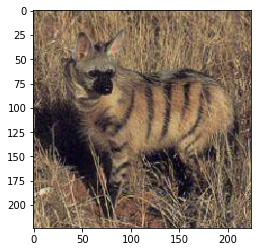

In [16]:
which_dog = 15
plt.imshow(X[which_dog], interpolation='hanning')
print(train['breed'][which_dog])
plt.show()

<a name="D8"></a>
### Encoding the labels (categorical features) into numerical values

* Labelencoder encodes target labels with value between 0 and (n_classes - 1)
* to_categorical converts to a binary class matrix

##### [**...Back to table of contents** ](#table)

In [0]:
y=train['breed'].values

label_encoder = LabelEncoder()
encoded = label_encoder.fit_transform(y)

y = to_categorical(encoded)

In [18]:
y[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0.], dtype=float32)

<a name="D9"></a>
### Getting the original label values from the categorical-"ized" label variable

* To do this, we use np.argmax()



##### [**...Back to table of contents** ](#table)

In [32]:
np.argmax(y[0])

19

In [0]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

<a name="D10"></a>
### Working with the labels




##### [**...Back to table of contents** ](#table)

Taking the first 1000 dog breed labels as a list called listy

In [0]:
listy = []
for i in range (0,1000):
  listy.append((train['breed'][i]))

Creating a second list, listy_2, that gets the unique breeds from listy

In [0]:
listy_2 = []
for i in listy:
    if i not in listy_2:
        listy_2.append(i)

In [39]:
listy_2

['boston_bull',
 'dingo',
 'pekinese',
 'bluetick',
 'golden_retriever',
 'bedlington_terrier',
 'borzoi',
 'basenji',
 'scottish_deerhound',
 'shetland_sheepdog',
 'walker_hound',
 'maltese_dog',
 'norfolk_terrier',
 'african_hunting_dog',
 'wire-haired_fox_terrier',
 'redbone',
 'lakeland_terrier',
 'boxer',
 'doberman',
 'otterhound',
 'standard_schnauzer',
 'irish_water_spaniel',
 'black-and-tan_coonhound',
 'cairn',
 'affenpinscher',
 'labrador_retriever',
 'ibizan_hound',
 'english_setter',
 'weimaraner',
 'giant_schnauzer',
 'groenendael',
 'dhole',
 'toy_poodle',
 'border_terrier',
 'tibetan_terrier',
 'norwegian_elkhound',
 'shih-tzu',
 'irish_terrier',
 'kuvasz',
 'german_shepherd',
 'greater_swiss_mountain_dog',
 'basset',
 'australian_terrier',
 'schipperke',
 'rhodesian_ridgeback',
 'irish_setter',
 'appenzeller',
 'bloodhound',
 'samoyed',
 'miniature_schnauzer',
 'brittany_spaniel',
 'kelpie',
 'papillon',
 'border_collie',
 'entlebucher',
 'collie',
 'malamute',
 'welsh

Creating a list of the first 1000 integer values for each dog breed label

In [0]:
listy_id_keys = []
for i in range (0,1000):
  listy_id_keys.append((np.argmax(y[i])))

Creating a second list that takes the unique integer values for each dog breed label. This will match to our other list of unique dog breeds

In [0]:
listy_2_id_keys = []
for i in listy_id_keys:
    if i not in listy_2_id_keys:
        listy_2_id_keys.append(i)

In [42]:
listy_2_id_keys

[19,
 37,
 85,
 15,
 49,
 10,
 18,
 7,
 97,
 99,
 113,
 73,
 79,
 2,
 118,
 89,
 68,
 21,
 38,
 83,
 106,
 58,
 12,
 26,
 0,
 67,
 55,
 40,
 114,
 48,
 54,
 36,
 110,
 17,
 109,
 80,
 100,
 57,
 66,
 46,
 53,
 8,
 6,
 95,
 90,
 56,
 5,
 14,
 94,
 77,
 24,
 63,
 84,
 16,
 42,
 33,
 71,
 115,
 29,
 93,
 88,
 72,
 65,
 3,
 69,
 74,
 25,
 11,
 4,
 70,
 27,
 60,
 31,
 96,
 1,
 82,
 92,
 75,
 43,
 59,
 22,
 111,
 30,
 44,
 81,
 103,
 104,
 39,
 50,
 101,
 78,
 23,
 28,
 35,
 52,
 9,
 112,
 116,
 64,
 117,
 98,
 105,
 62,
 61,
 76,
 87,
 34,
 119,
 86,
 51,
 13,
 102,
 107,
 47,
 45,
 20,
 108,
 41,
 32,
 91]

Here, we create a dictionary, matching each unique integer label value to its corresponding dog breed label. We use our unique label lists that we just created: listy_2_id_keys and listy_2

In [47]:
classes_official = dict(zip(listy_2_id_keys, listy_2))
classes_official

{0: 'affenpinscher',
 1: 'afghan_hound',
 2: 'african_hunting_dog',
 3: 'airedale',
 4: 'american_staffordshire_terrier',
 5: 'appenzeller',
 6: 'australian_terrier',
 7: 'basenji',
 8: 'basset',
 9: 'beagle',
 10: 'bedlington_terrier',
 11: 'bernese_mountain_dog',
 12: 'black-and-tan_coonhound',
 13: 'blenheim_spaniel',
 14: 'bloodhound',
 15: 'bluetick',
 16: 'border_collie',
 17: 'border_terrier',
 18: 'borzoi',
 19: 'boston_bull',
 20: 'bouvier_des_flandres',
 21: 'boxer',
 22: 'brabancon_griffon',
 23: 'briard',
 24: 'brittany_spaniel',
 25: 'bull_mastiff',
 26: 'cairn',
 27: 'cardigan',
 28: 'chesapeake_bay_retriever',
 29: 'chihuahua',
 30: 'chow',
 31: 'clumber',
 32: 'cocker_spaniel',
 33: 'collie',
 34: 'curly-coated_retriever',
 35: 'dandie_dinmont',
 36: 'dhole',
 37: 'dingo',
 38: 'doberman',
 39: 'english_foxhound',
 40: 'english_setter',
 41: 'english_springer',
 42: 'entlebucher',
 43: 'eskimo_dog',
 44: 'flat-coated_retriever',
 45: 'french_bulldog',
 46: 'german_sheph

<a name="D11"></a>
### Proving that the labels are corresponding to the correct integer values




##### [**...Back to table of contents** ](#table)

boston_bull


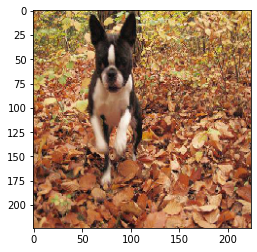

dingo


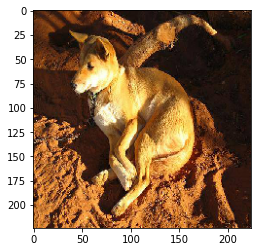

pekinese


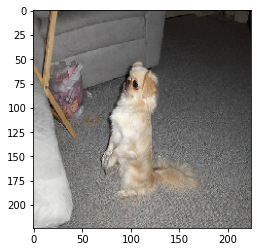

bluetick


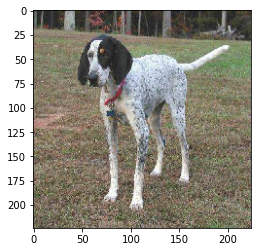

golden_retriever


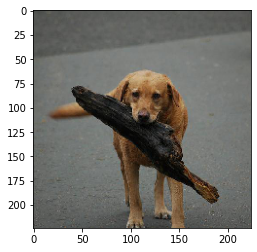

bedlington_terrier


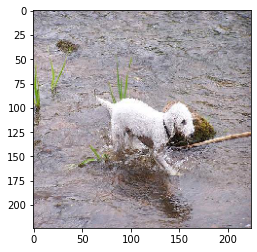

bedlington_terrier


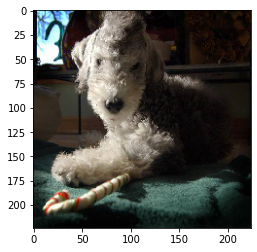

borzoi


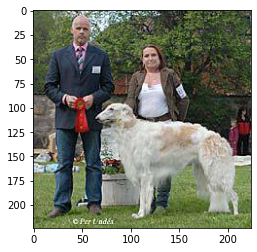

basenji


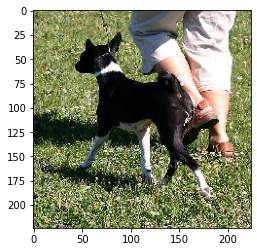

scottish_deerhound


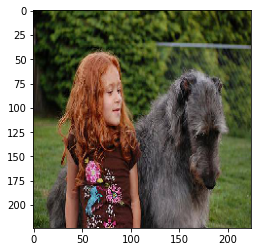

shetland_sheepdog


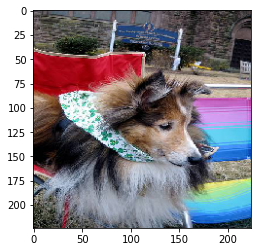

walker_hound


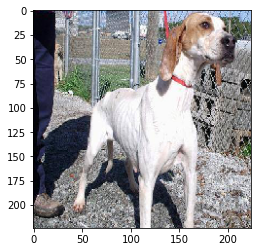

maltese_dog


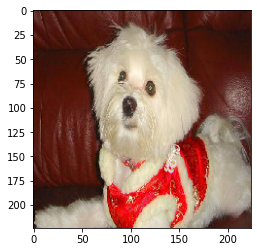

bluetick


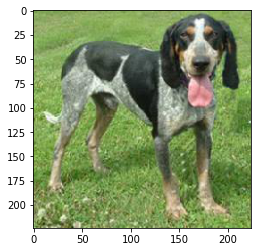

norfolk_terrier


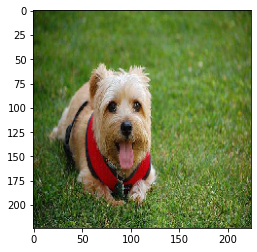

african_hunting_dog


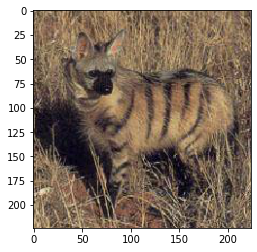

wire-haired_fox_terrier


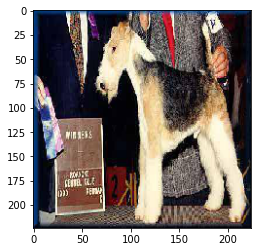

redbone


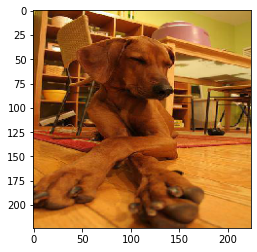

lakeland_terrier


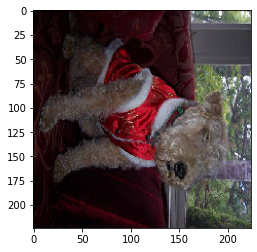

boxer


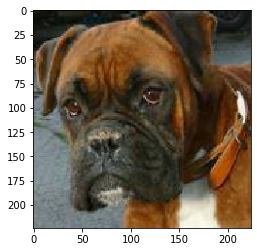

doberman


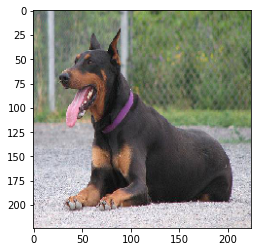

otterhound


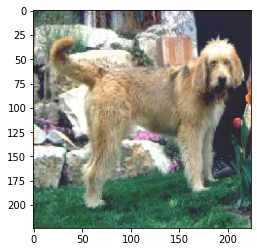

otterhound


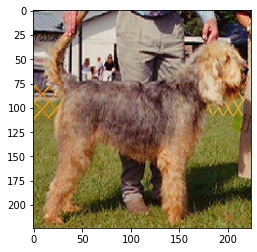

bedlington_terrier


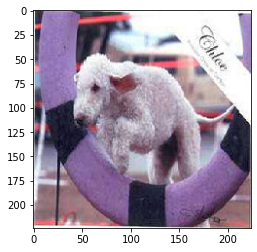

dingo


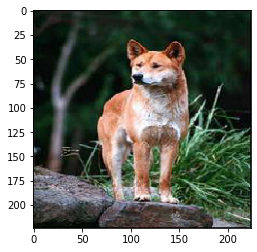

golden_retriever


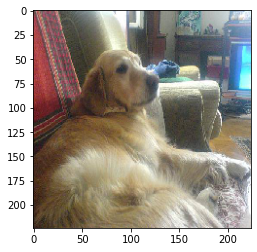

standard_schnauzer


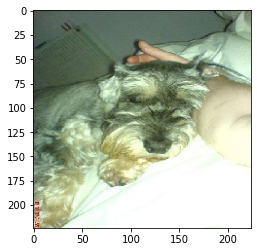

irish_water_spaniel


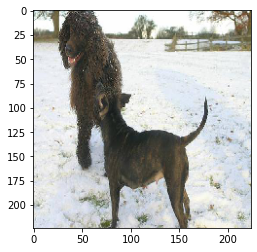

black-and-tan_coonhound


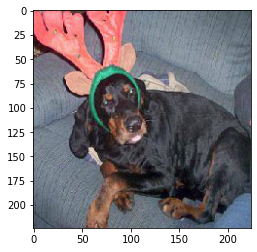

cairn


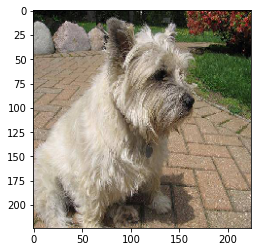

affenpinscher


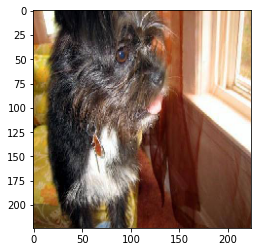

labrador_retriever


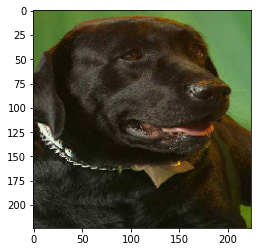

ibizan_hound


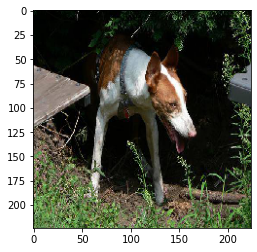

english_setter


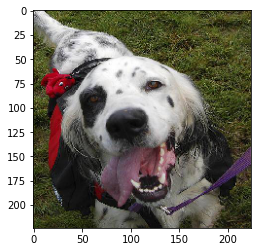

walker_hound


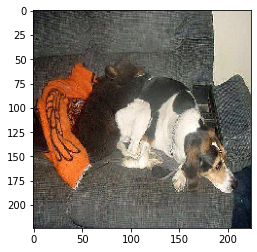

weimaraner


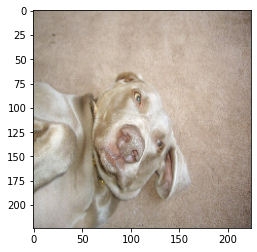

giant_schnauzer


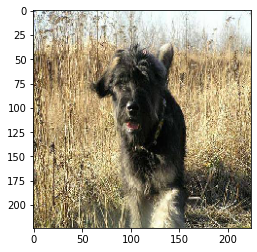

golden_retriever


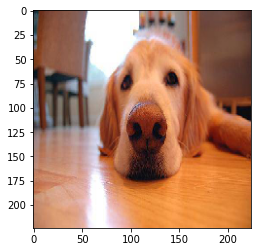

boston_bull


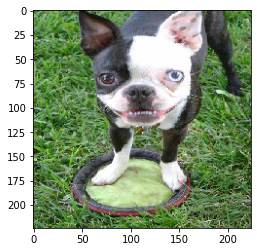

groenendael


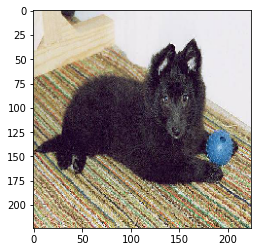

lakeland_terrier


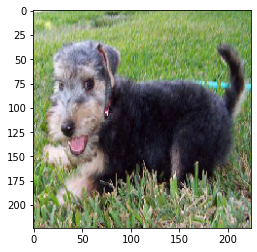

irish_water_spaniel


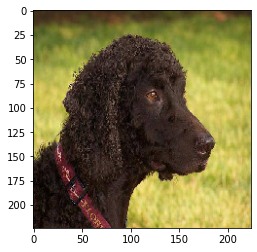

dhole


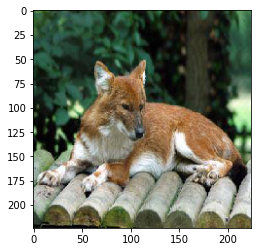

dingo


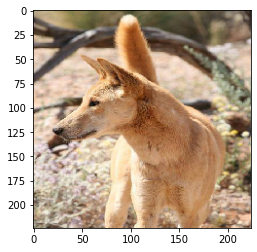

affenpinscher


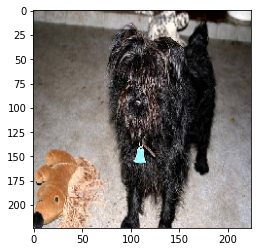

toy_poodle


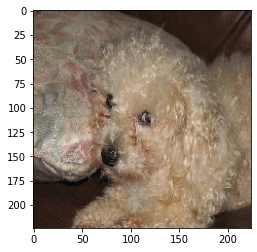

border_terrier


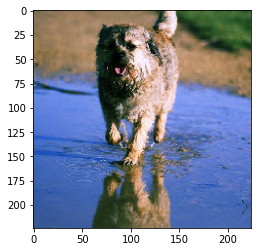

lakeland_terrier


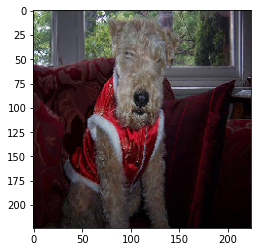

tibetan_terrier


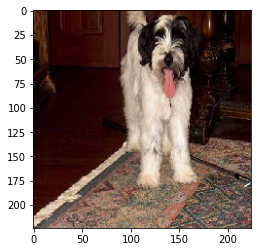

norwegian_elkhound


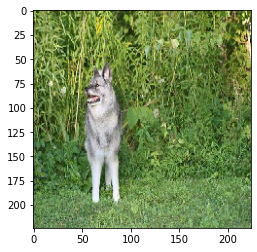

african_hunting_dog


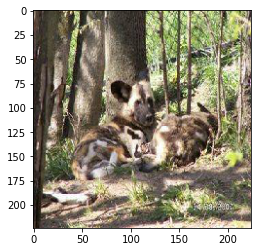

irish_water_spaniel


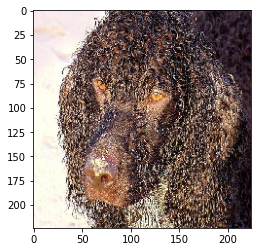

walker_hound


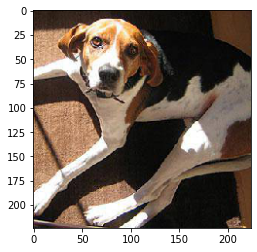

irish_water_spaniel


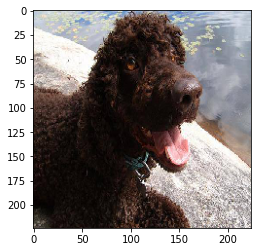

wire-haired_fox_terrier


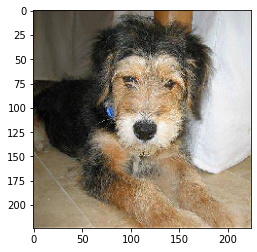

giant_schnauzer


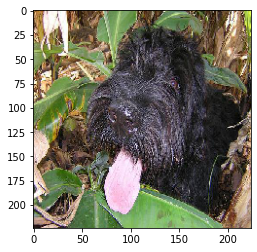

affenpinscher


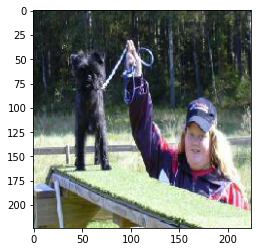

shih-tzu


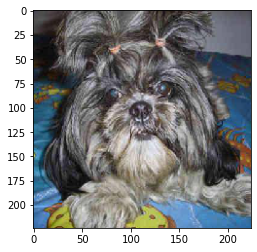

irish_terrier


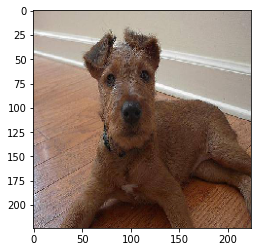

kuvasz


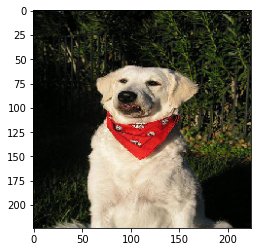

german_shepherd


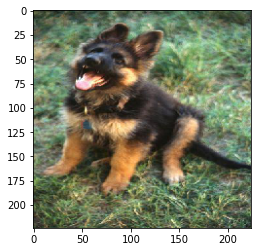

greater_swiss_mountain_dog


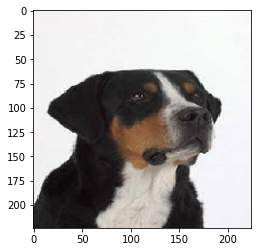

basset


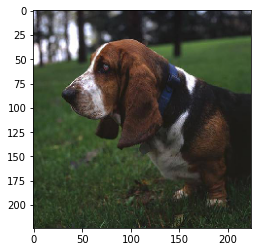

australian_terrier


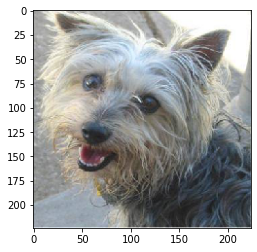

schipperke


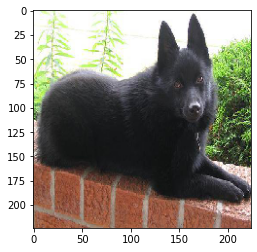

rhodesian_ridgeback


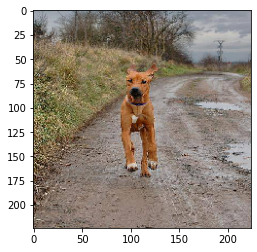

irish_setter


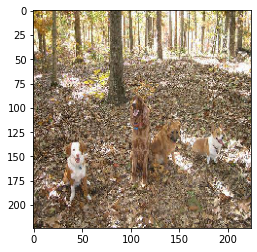

appenzeller


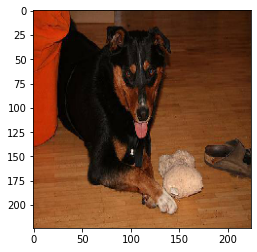

german_shepherd


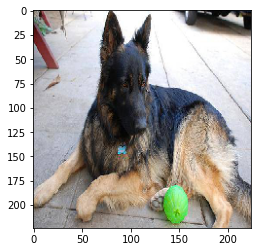

bloodhound


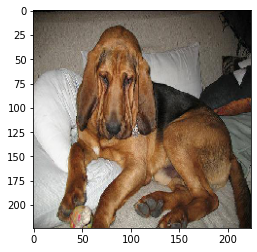

samoyed


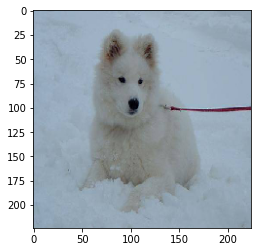

miniature_schnauzer


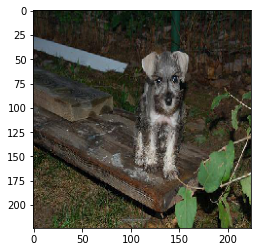

brittany_spaniel


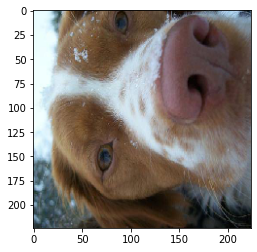

english_setter


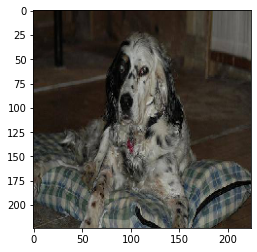

kelpie


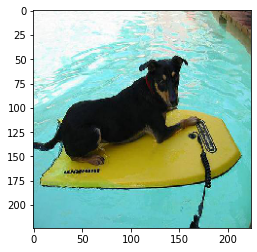

papillon


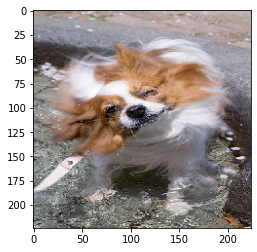

border_collie


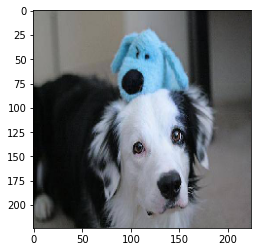

brittany_spaniel


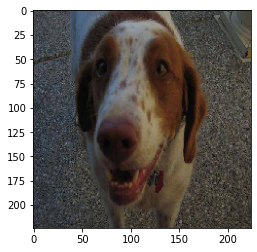

appenzeller


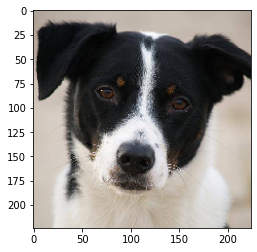

scottish_deerhound


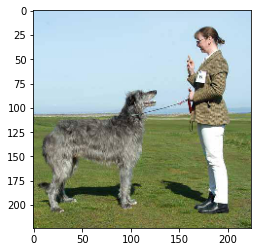

entlebucher


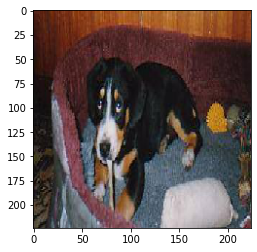

collie


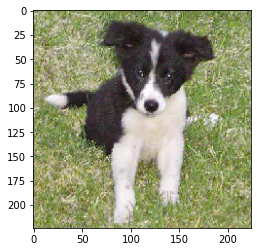

malamute


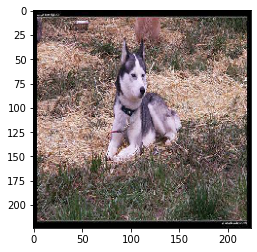

welsh_springer_spaniel


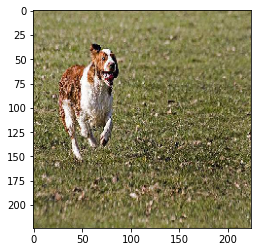

chihuahua


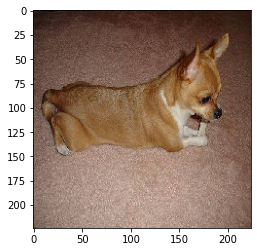

border_terrier


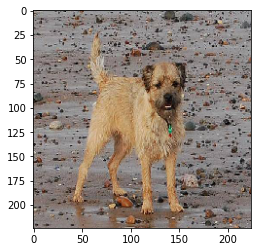

saluki


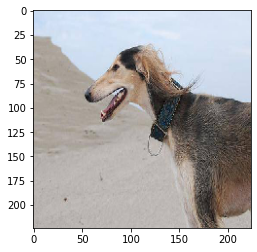

weimaraner


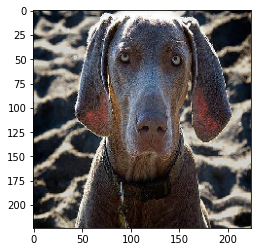

entlebucher


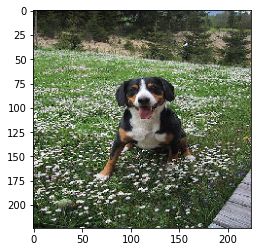

irish_terrier


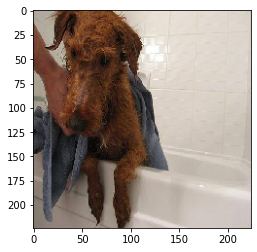

maltese_dog


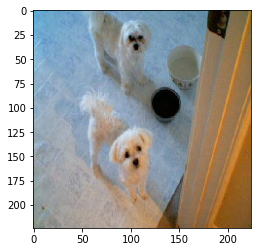

bloodhound


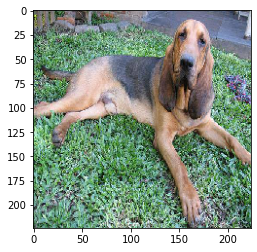

pug


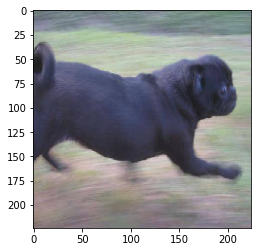

standard_schnauzer


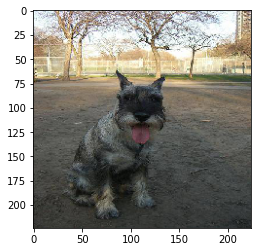

malinois


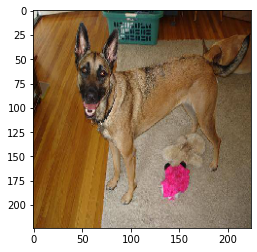

english_setter


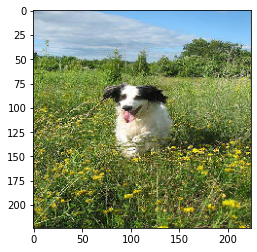

wire-haired_fox_terrier


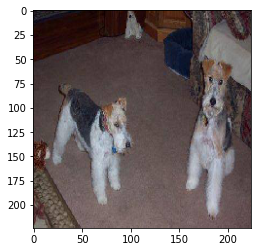

pug


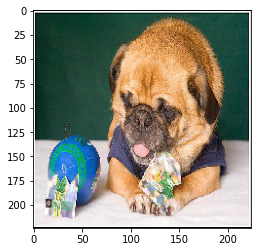

lakeland_terrier


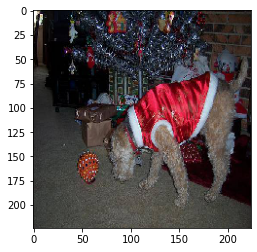

boxer


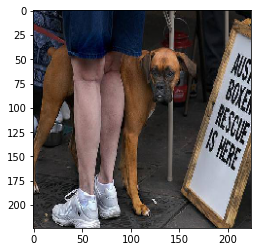

rhodesian_ridgeback


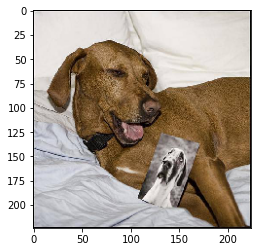

komondor


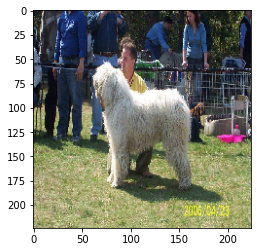

airedale


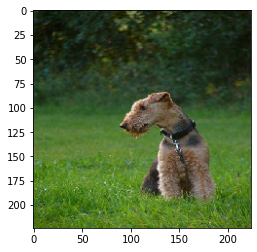

wire-haired_fox_terrier


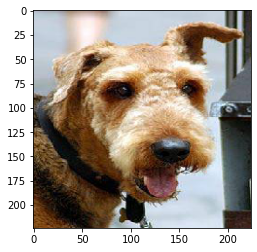

english_setter


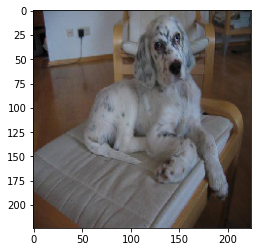

leonberg


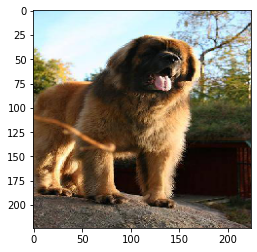

giant_schnauzer


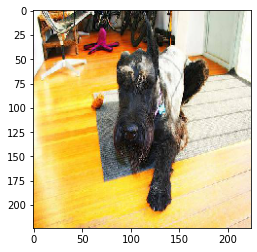

mexican_hairless


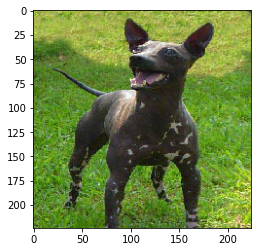

irish_terrier


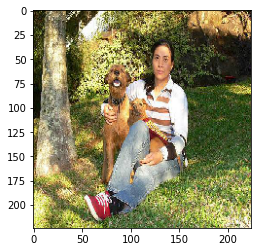

rhodesian_ridgeback


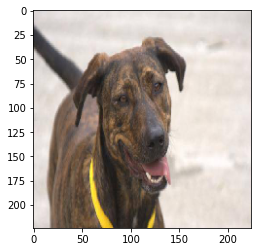

saluki


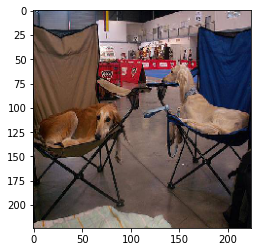

leonberg


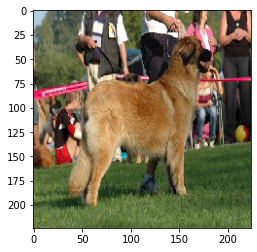

bull_mastiff


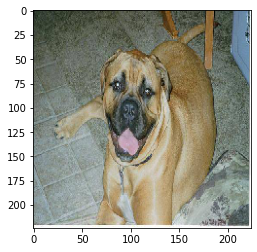

dingo


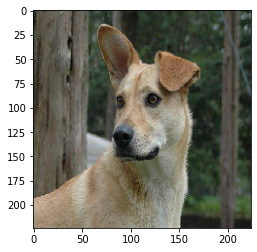

irish_setter


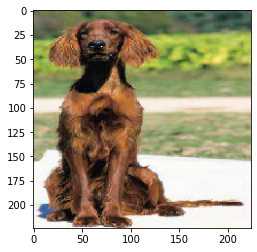

airedale


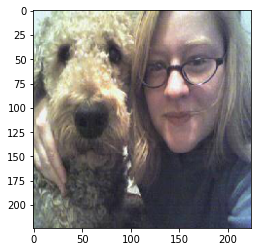

brittany_spaniel


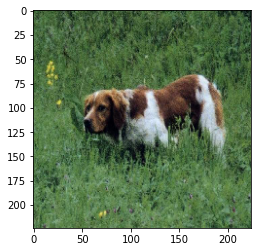

bull_mastiff


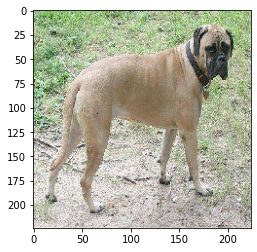

bernese_mountain_dog


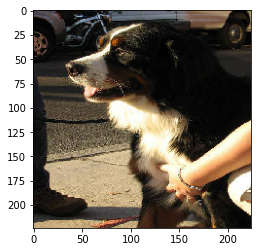

bluetick


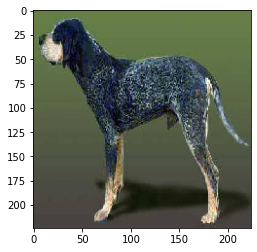

In [48]:
for i in range(0,120):
  img = image.load_img('train/'+str(train['id'][i])+'.jpg', target_size=(224,224,1), grayscale=False)
  plt.imshow(img, interpolation='hanning')
  print(classes_official[np.argmax(y[i])])
  plt.show()

***
***


 <a name="C"></a>
# C) Applying a CNN Model to the Data


##### [**...Back to table of contents** ](#table)

<a name="D12"></a>
### The shape of the data.




##### [**...Back to table of contents** ](#table)

In [49]:
X_train.shape

(8177, 224, 224, 3)

In [50]:
X_test.shape

(2045, 224, 224, 3)

In [51]:
y_train.shape

(8177, 120)

In [52]:
y_test.shape

(2045, 120)

***

<a name="D13"></a>
### Keras Densenet with 120 classes




##### [**...Back to table of contents** ](#table)

In [53]:
model = keras.applications.densenet.DenseNet121(include_top=True, weights=None, input_tensor=None, input_shape=None, pooling=None, classes=120)


Printing out the layers of the densenet, we can see the number of parameters here too.

In [54]:
model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
________________________________________________________________________________________

We use Adam optimizer because it is very computationaly efficient and is good for problems with many parameters

In [55]:
optimizer = Adam(lr=1e-3)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['acc'])

<a name="D14"></a>
### Training the model




##### [**...Back to table of contents** ](#table)

##### 30 Epochs Densenet

The epochs in the fit() call below can be changed to be higher. This implementation of 30 epochs was for use in our project demo. We also had run a 300 epoch version of the same model, which got a 22% score
. You can run it yourself and see the difference between lower epoch runs and higher epoch runs.

In [0]:
model.fit(X_train, y_train, epochs=30, validation_data=(X_test, y_test))

Train on 8177 samples, validate on 2045 samples
Epoch 1/30
8177/8177 [==============================] - 100s 12ms/step - loss: 4.8969 - acc: 0.0132 - val_loss: 13.7816 - val_acc: 0.0083
Epoch 2/30
8177/8177 [==============================] - 73s 9ms/step - loss: 4.7212 - acc: 0.0196 - val_loss: 5.5314 - val_acc: 0.0142
Epoch 3/30
8177/8177 [==============================] - 73s 9ms/step - loss: 4.5801 - acc: 0.0280 - val_loss: 5.9334 - val_acc: 0.0289
Epoch 4/30
8177/8177 [==============================] - 73s 9ms/step - loss: 4.4194 - acc: 0.0419 - val_loss: 5.6324 - val_acc: 0.0279
Epoch 5/30
8177/8177 [==============================] - 73s 9ms/step - loss: 4.2597 - acc: 0.0510 - val_loss: 6.1436 - val_acc: 0.0205
Epoch 6/30
8177/8177 [==============================] - 73s 9ms/step - loss: 4.1428 - acc: 0.0649 - val_loss: 6.3647 - val_acc: 0.0274
Epoch 7/30
8177/8177 [==============================] - 73s 9ms/step - loss: 4.0215 - acc: 0.0843 - val_loss: 4.3686 - val_acc: 0.0528
Epoc

In [0]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("DenseNet score: %.2f%%" % (scores[1]*100))

DenseNet score: 18.48%


***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***

 <a name="D"></a>
# D) Prediction of Dog Breed 




<a name="D15"></a>
## "Let's try this model on my Blenheim Spaniel"




##### [**...Back to table of contents** ](#table)


* First we import a dog image file external to the dataset: "My dog."
* We convert it into an arrray of the correct size so the model can read it.

In [0]:
download5 = drive.CreateFile({'id': '1eynYjSPr_5qhZeyQTaxVN_aFqSjk2pxk'})
download5.GetContentFile('blenheim_spaniel.jpg.zip')
!unzip blenheim_spaniel.jpg.zip

test_images = []
for i in tqdm(range(1)):
    img = image.load_img('blenheim_spaniel.jpg', target_size=(224,224,1), grayscale=False)
    img = image.img_to_array(img)
    img = img/255
    test_images.append(img)
tester = np.array(test_images)

Archive:  blenheim_spaniel.jpg.zip
replace blenheim_spaniel.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: blenheim_spaniel.jpg    
  inflating: __MACOSX/._blenheim_spaniel.jpg  


100%|██████████| 1/1 [00:00<00:00, 97.12it/s]


Here, we show the image of the dog with the actual dog breed label above it. Below the line, we have the dog breed label predicted by the model.

Blenheim Spaniel


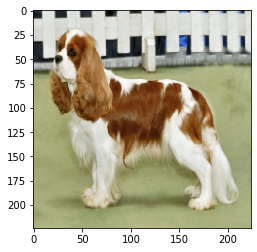

____________________________

13
blenheim_spaniel


In [0]:
plt.imshow(tester[0], interpolation='hanning')
print("Blenheim Spaniel")
plt.show()
print('____________________________\n')
prediction = model.predict(tester)
print(np.argmax(prediction))
print(classes_official[np.argmax(prediction)])

***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***
***

 <a name="E"></a>
# E) Model Results on Test Data


##### [**...Back to table of contents** ](#table)

We'll take a look at how well the model predicts the dog breed of the images in the test set in this section. The test set has 2045 images.

In [0]:
X_test.shape

(2045, 224, 224, 3)

<a name="D16"></a>
### Creating a Prediction Breed vs. Actual Breed DataFrame




##### [**...Back to table of contents** ](#table)

We start by creating lists: one with the breed labels predicted by the model, and one with the actual/correct breed label. 

In [0]:
predictions = model.predict(X_test)
predictions_list = []
actuals_list = []
for i in range(2045):
  #print("Actual: ", classes_official[np.argmax(y_test[i])])
  actuals_list.append(classes_official[np.argmax(y_test[i])])
  #plt.imshow(X_test[i], interpolation='hanning')
  #plt.show()
  #print("Prediction: ", classes_official[np.argmax(predictions[i])])
  predictions_list.append(classes_official[np.argmax(predictions[i])])

Next, we add the lists to a dictionary, and transform the dictionary to a pandas DataFrame

In [0]:
d = {'PREDICTION_BREED': predictions_list, 'ACTUAL_BREED': actuals_list}
pred_act_df = pd.DataFrame(d)


You can see the DataFrame below.

In [0]:
pd.set_option('display.max_rows', 2500)
pred_act_df

,PREDICTION_BREED,ACTUAL_BREED
0,samoyed,toy_terrier
1,vizsla,irish_setter
2,irish_wolfhound,scottish_deerhound
3,kuvasz,english_setter
4,great_pyrenees,great_pyrenees
5,tibetan_terrier,german_short-haired_pointer
6,shetland_sheepdog,soft-coated_wheaten_terrier
7,welsh_springer_spaniel,welsh_springer_spaniel
8,malamute,boston_bull
9,pembroke,chihuahua


<a name="D17"></a>
### Number of Incorrect Predictions


We look at all the times the prediction breed IS NOT the same as the actual breed.

##### [**...Back to table of contents** ](#table)

In [0]:
incorrects = pred_act_df.query('PREDICTION_BREED != ACTUAL_BREED')
print(incorrects.count())

PREDICTION_BREED    1667
ACTUAL_BREED        1667
dtype: int64


<a name="D18"></a>
### Number of Correct Predictions


We look at all the times the prediction breed IS the same as the actual breed.

##### [**...Back to table of contents** ](#table)

In [0]:
corrects = pred_act_df.query('PREDICTION_BREED == ACTUAL_BREED')
print(corrects.count())

PREDICTION_BREED    378
ACTUAL_BREED        378
dtype: int64


<a name="D19"></a>
### Percent Correct Predictions

##### [**...Back to table of contents** ](#table)

In [3]:
correct = 378/2045 *100
print(correct)

18.4841075794621


<a name="D20"></a>
### Percent Incorrect Predictions

##### [**...Back to table of contents** ](#table)

In [4]:
incorrect = 1667/2045 *100
print(incorrect)

81.5158924205379


<a name="D21"></a>
### Which dog breeds was the model best at predicting?

##### [**...Back to table of contents** ](#table)

In [0]:
corrects['PREDICTION_BREED'].value_counts()

entlebucher                    16
blenheim_spaniel               16
japanese_spaniel               13
african_hunting_dog            11
schipperke                     10
papillon                        9
bernese_mountain_dog            9
pembroke                        8
english_springer                8
greater_swiss_mountain_dog      7
scottish_deerhound              6
saint_bernard                   6
ibizan_hound                    6
maltese_dog                     6
shetland_sheepdog               6
miniature_pinscher              6
malamute                        6
samoyed                         6
welsh_springer_spaniel          6
lakeland_terrier                6
brittany_spaniel                5
border_terrier                  5
clumber                         5
siberian_husky                  5
dhole                           5
pomeranian                      5
leonberg                        5
komondor                        5
irish_setter                    5
beagle        

<a name="D22"></a>
### Which dog breeds was the model worst at predicting?

##### [**...Back to table of contents** ](#table)

In [0]:
incorrects['PREDICTION_BREED'].value_counts()

brittany_spaniel                  55
tibetan_mastiff                   52
borzoi                            51
maltese_dog                       48
shetland_sheepdog                 47
black-and-tan_coonhound           43
french_bulldog                    43
samoyed                           41
blenheim_spaniel                  39
english_setter                    37
saluki                            35
keeshond                          34
malamute                          34
staffordshire_bullterrier         34
affenpinscher                     32
siberian_husky                    32
irish_wolfhound                   29
pembroke                          29
lhasa                             27
beagle                            26
redbone                           25
eskimo_dog                        24
schipperke                        22
collie                            22
clumber                           21
boxer                             21
bernese_mountain_dog              21
f

***
***
***
***
***
***